<div style="display: none">
    <h1> . </h1>
    <h1> . </h1>
</div>



# Image Processing Python Lab - FILTERING
<hr style="height:1px; border:none; background-color:#00A6D6;">



Here is a guide to the different symbols of the lab: <br>
<span style="font-size: 20px">❓</span> - This symbol means that there is a required theoretical question related to the assignment. Your answer to the specified question should go in the yellow box below it. <br>
<span style="font-size: 20px">ℹ️</span> - This symbol means that there is some additional or important information related to the lab or specific exercise. <br>
<span style="font-size: 20px">💬</span> - This symbol means that the following text is part of the overarching story you follow, giving you more context into what you are doing and how it is applicable in real-life situations.

## Convert to PDF

<div style="background-color:#0DA006; padding:10px; color: white; border-radius: 10px" >
First try to convert to PDF via LaTeX:
<ul>
  <li>First you need to make sure that you have LaTeX installed (this goes for whatever operating system you are using). You can go to https://www.latex-project.org/get/ and get the proper distribution for your operating system.</li>
  <li>After doing that, you can go to where xelatex.exe is found (this should be in AppData\\Local\\Programs\\MiKTeX\\miktex\\bin\\x64\\xelatex.exe if you are getting MiKTeXfor Windows, or the equivalent on other any other OS). If you are having a hard time finding the folder, you can use "where xelatex" as a command for Windows, the find command for Mac and Linux or just use the file explorer.</li>
  <li>After making sure you have xelatex setup, you can try the "PDF via LaTeX" in the "File" -> "Download as" menu in jupyter notebook</li>
</ul>
If the above option does not work you can follow these instructions:
<ul>
  <li>Go into "File" -> "Print Preview"</li>
  <li>Make sure the generated PDF is readable then you can use Ctrl+P or Command+P (on MacOS) to Print Page, where you select to save to PDF rather than printing (each system has a different interface).</li>
  <li>Before submitting make sure that all answers//code//plots are clearly visible.</li>
</ul>
If none of the methods work, contact a TA during labs and ask about further steps.
</div>

__Objectives__
- Determine which type of noise is present in an image
- Determine the most suitable techniques to remove a given type of noise 
- Apply smoothing on an image using a box filter & gaussian filter
- Apply sharpening filter 
- Define the difference between linear and non-linear filters.
- Motivate the choice of sequence of filter to enhance an input image
- Compare the noise removal of morphological operation to the filtering operations applied in this lab
- Determine the function of a filter from its shape
- Design a filter to perform the required effect


<hr>

<div style="background-color:#00A6D6; padding:10px; color: white; border-radius: 10px" >
<p style="font-size:25px">💬</p>
You receive a report that a car matching the description has been seen in a neighbourhood downtown. However, due to the recent storms the cameras in the area have suffered different distortion effects on the images they produce. As usual, Jeeves has spent some time and tried to find the best images possible (provided and indexed in the folders) but even those have traces of these defects. Now you, as a professional in the field, know that in some cases these problems can be solved with LTI filters. You grab yet another cup of coffee and head to your desk.
</div>

<div style="padding:10px" >
<span style="font-size: 20px">ℹ️</span>
<i>
In the folder of the Lab Notebook you are also given several folders with images to accompany the exercises you're about to start. In most of the exercises the path to the image is already specified and you only need to add the name of the file you want to work with. 
Additionally in some code cells you'll be given code that you can use as is. Please do not change the given functions signature (that includes the names, inputs and return values).

You can read the image(s) into the notebook using the command `plt.imread("path/to/file.jpg")`
<i>

<div style="padding:10px" >
<font size=4>ℹ️</font>
<i>
 Some code cells and exercises have some code already provided for you to use. The steps for the exercises you need to do in the code cells are marked with comments. Your code should go under the corresponding comment line describing the specific step. You can treat those lines as "TODO" items.
</i>

In [1]:
##########################################################################################
# Importing various modules. These will be used throughout this Jupyter Notebook
# You do not need to add anything here
##########################################################################################

# If you're having problems with the imports uncomment the following lines to install the libraries
# !pip install opencv-python
# !pip install numpy
# !pip install pickle-mixin
# !pip install matplotlib
# !pip install imutils

# import matplotlib for data visualisation
import matplotlib.pyplot as plt

# import NumPy for better matrix support
import numpy as np

# import Pickle for data serialisation
import pickle as pkl

# import cv2 and imutils for image processing functionality
import cv2
import imutils



In [2]:
# A plotting function to make your work easier

# Displays a given RGB image using matplotlib.pyplot 
# (works for grayscale as well; remember to specify the correct cmapType)
def plotImage(img, title, cmapType=None):
    plt.figure(figsize=(15,8))
    # Display image
    if (cmapType):
        plt.imshow(img, cmap=cmapType)
    else:
        plt.imshow(img)
    
    plt.title(title)
    plt.show()


def loadImage(filepath, filename, grayscale=True):
    return cv2.imread(filepath+filename, cv2.IMREAD_GRAYSCALE if grayscale else cv2.IMREAD_COLOR)


## PYTHON HANDS-ON Assignment III.1: Low-pass filter - Denoising images using filtering



<div style="background-color:#00A6D6; padding:10px; color: white; border-radius: 10px" >
<p style="font-size:25px">💬</p>
Sitting down at your desk you see that the first set of sorted images Jeeves has provided for you suffer from different kinds of noise that need to be fixed. You pull your keyboard closer and get to work.
</div>

<b> Completion requirements for this assignment: </b>
- Implement 2D convolution and correlation
- Implement the proper filter for removing / reducing the specific noise
- Implement various ways of removing noise from images using different sizes of box filters
- Answer all questions regarding the process and images

<div style="background-color:#c2eafa"> 

### III.1.1 Convolution and Correlation in 2D
Application of a Linear Time-Invariant (LTI) filter to an image is done by either convolution or cross-correlation. In this part you'll implement both. You can refer to the formula provided below, or to the slides of this particular week.

![Convolution and Correaltion formulas](resources/lab_03/other/Convolution_And_Correlation.png)
    
<span style="font-size: 20px">ℹ️</span>Instead of using 4-nested-for-loops to implement the 2D-covolution or 2D-correleation, you can just use the two outer for loops. The two inner for loops, where you do an element-wise-multiplication of the kernel elements with a sub-set of the image then summing the result, can be written in one line of code that uses: 
    
- `np.sum()` function and 
- using the correct `np` syntax of matrix multiplication. 
    
For example:
    
` np.array([[2, 4], [3, 5]]) * np.array([[1, 2], [3, 4]]) = np.array([[1*2, 4*2], [3*3, 5*4]])`
    
ℹ️ Make sure you do not translate the image in any direction. To avoid this, make sure you are padding the image correctly and saving the result of the kernel to the middle pixel, instead of the corner one!
    
ℹ️ Check if your input image is **grayscale** (only one channel) **or colored** (more than one channel) by *printing the image shape* before applying your filter. The image might be gray in color, but is read into a colored opencv array of three channels. For this exercise, we only ask you to implement it on **grayscale** images.
   
ℹ️ Make sure that you are applying the filter to **all** the image's channels (either one in case of grayscale, or 3 in case of colored). 
    
ℹ️ You can use the opencv function `image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)`  to convert from colored image to grayscale. 

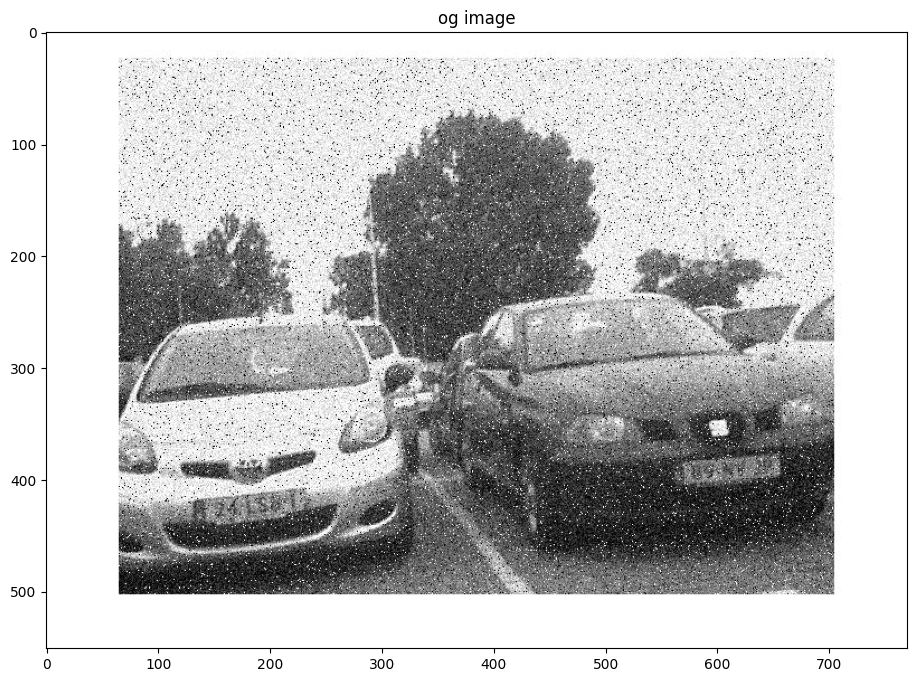

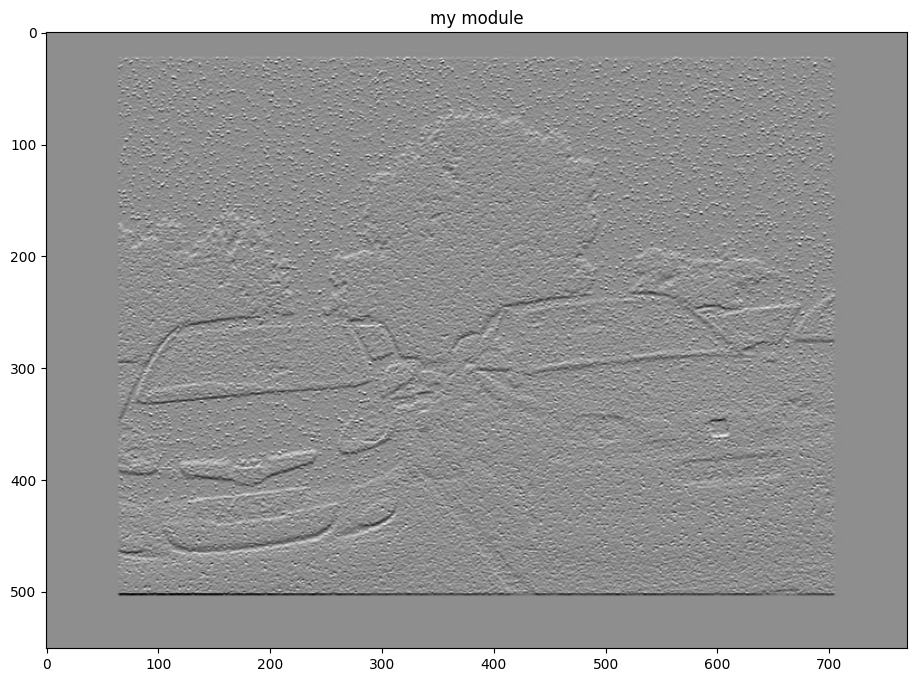

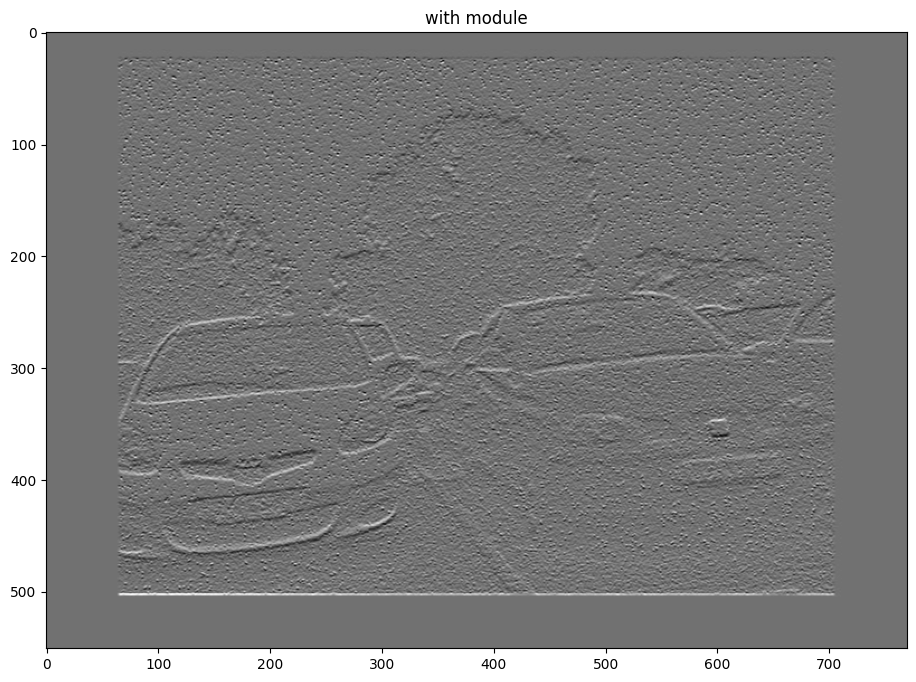

In [73]:
# Define a function to do both convolution and correlation with the given parameters
def filter2D(image, conv_corr_bool, kernel, pad=0):

    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Get image and kernel dimensions
    img_height, img_width = image.shape
    kernel_height, kernel_width = kernel.shape
    kernelSize =  kernel_height // 2
    # Initialize the filtered image
    filtered_image = np.zeros_like(image, dtype = np.float64)

    if conv_corr_bool:
        kernel = np.flipud(np.fliplr(kernel))

    # Apply filter using convolution or cross-correlation
    for i in range(kernelSize, img_height - kernelSize):
        for j in range(kernelSize, img_width - kernelSize):
            img_subset = image[i-kernelSize:i+kernelSize+1, j-kernelSize:j+kernelSize+1]
            filtered_image[i, j] = np.sum(np.multiply(img_subset,kernel))
    return filtered_image


# Load image and make sure it is grayscale
path = "resources/lab_03/exercise_01/"

# Plot Original Image
image = loadImage(path, "car_noisy_gray.jpg")

# Add padding using NumPy

plotImage(image, "og image", plt.cm.gray)
# Define a kernel

kernel = np.ones((3, 3)) * 1/9
kernel = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])
# Do filtering on the image with the given kernel using the function you've just created

filtered_image = filter2D(image, True, kernel, 3)
# Plot the filtered result
plotImage(filtered_image, "my module", plt.cm.gray)

# Do filtering on the image with the given kernel 
# (use the cv2 implementation of filter2D to compare with your result)

filtered_with_module = cv2.filter2D(image, cv2.CV_64F, kernel)
plotImage(filtered_with_module, "with module", plt.cm.gray)


# Plot the filtered result


<div style="background-color:#c2eafa">

### III.1.2 Averaging Box LTI Filter
The simplest type of noise reduction is using the box filter. Denoise the image provided using the box filter as the first noise reduction trial. Use the filter2D function implemented in the previous section to apply the filter. Experiment the effect of kernel size by applying the following filter sizes:
- 3 * 3
- 5 * 5
- 7 * 7


ℹ️ Usually kernel/filter shapes are square but that doesn't have to be the case. For simplicity right now we assume that the shape is square. In that case we only need one parameter to define the size of the filter. That would be `kernelSize * kernelSize` 

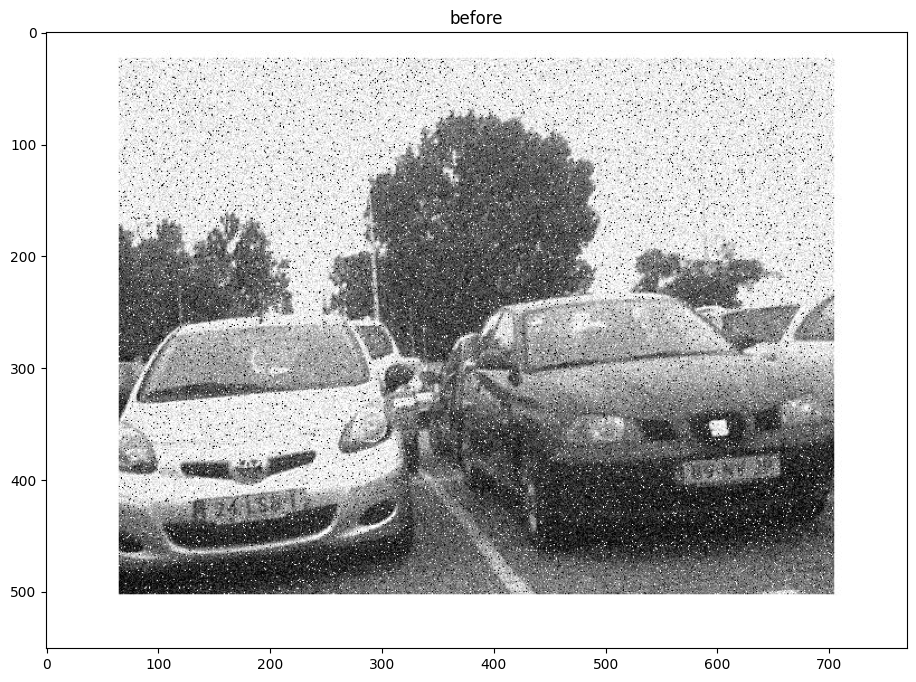

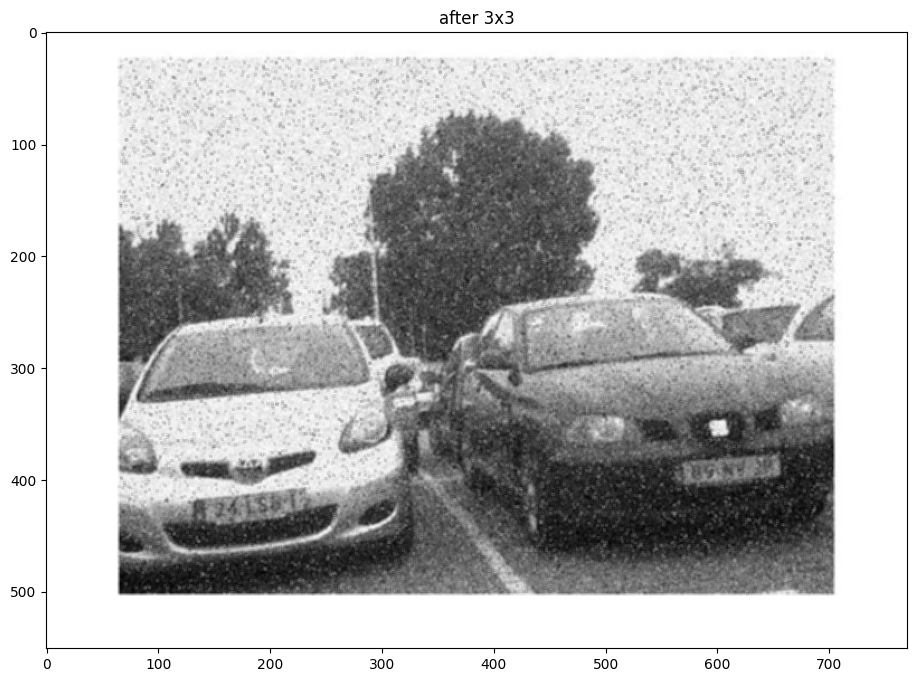

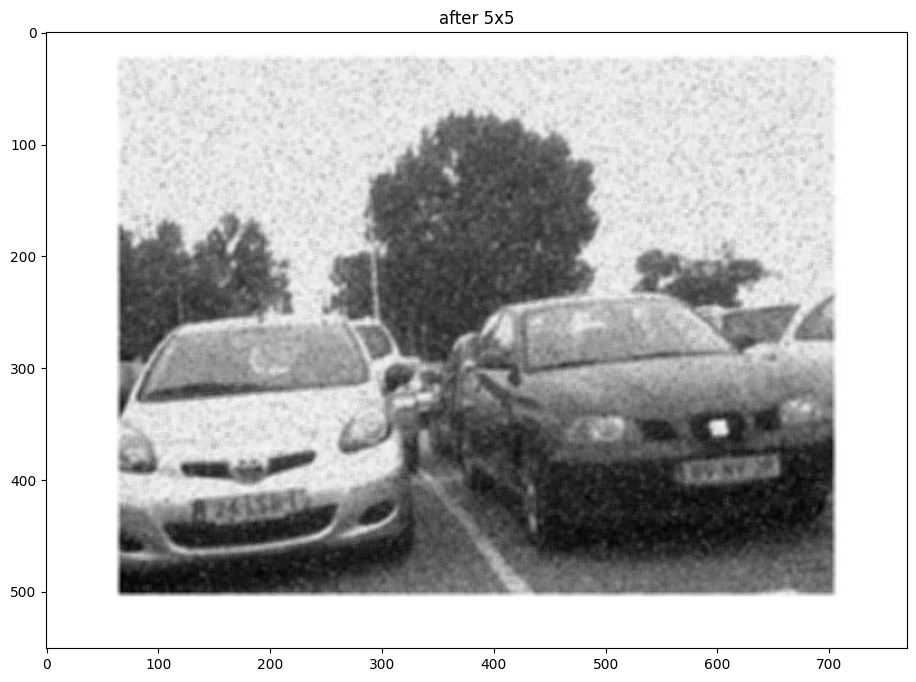

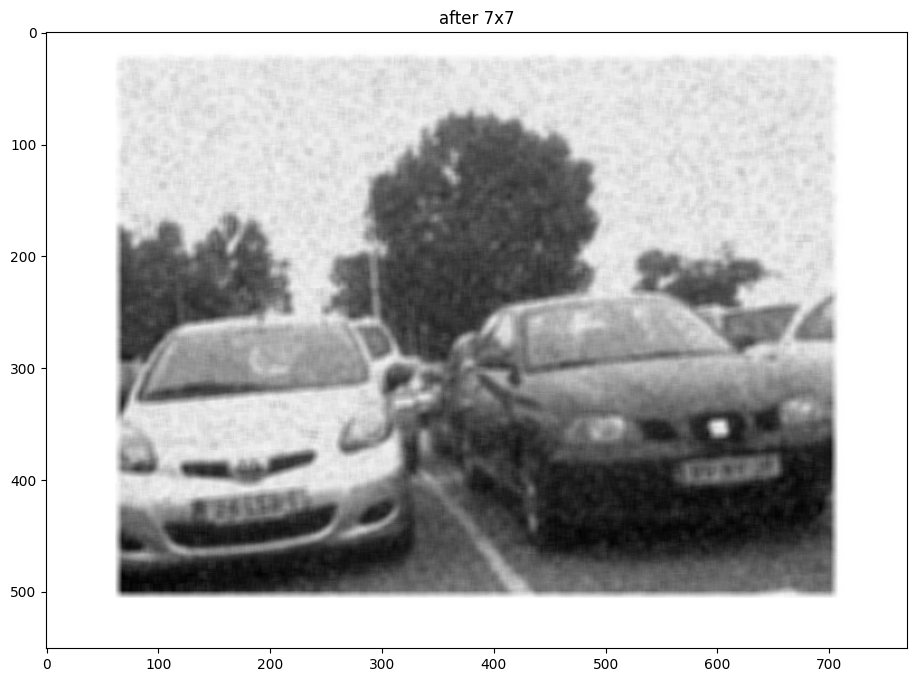

In [4]:
# Define a function to do the filtering with a box filter
def boxFilter(img, kernel, padding):  
   
    return filter2D(image, -1, kernel)

# Load image
path = "resources/lab_03/exercise_01/"

# Plot original image
image = loadImage(path, "car_noisy_gray.jpg")
plotImage(image, "before", plt.cm.gray)
# Create different kernels
k3 = np.ones((3, 3)) * (1/9)
k5 = np.ones((5, 5)) * (1/25)
k7 = np.ones((7, 7)) * (1/49)
# Reduce noise using the defined filter function with different kernel sizes as parameters
i3 = boxFilter(image, k3, 0)
i5 = boxFilter(image, k5, 0)
i7 = boxFilter(image, k7, 0)
# Plot the images

plotImage(i3, "after 3x3", plt.cm.gray)
plotImage(i5, "after 5x5", plt.cm.gray)
plotImage(i7, "after 7x7", plt.cm.gray)



<div style="background-color:#c2eafa">

### III.1.3 Gaussian LTI Filter

A more advanced method of apply smoothing to an image is using a weighted average (instead of uniform averaging; i.e., box filter). The Gaussian filter is used to apply such weighted average using the following formula (also present in the lecture slides):
![Gaussian Formula](resources/lab_03/other/Gaussian_Function.png)

Implement the Gaussian kernel function. It is a function that takes two input parameters, (1) kernel size and (2) sigma. The output is a Gaussian filter kernel.
Apply it to the image using your previously implement Filter_2D function. Compare the smoothing done by the box filter with the gaussian filter by applying the same kernel sizes as the ones used in the box filter:
- 3 * 3
- 5 * 5
- 7 * 7 
   
    
ℹ️ Usually kernel/filter shapes are square but that doesn't have to be the case. For simplicity right now we assume that the shape is square. In that case we only need one parameter to define the size of the filter. That would be `kernelSize * kernelSize` 
    
**Make sure to specify the sigma used for each kernel. In general the kernelSize should be larger than 6*sigma!**
    

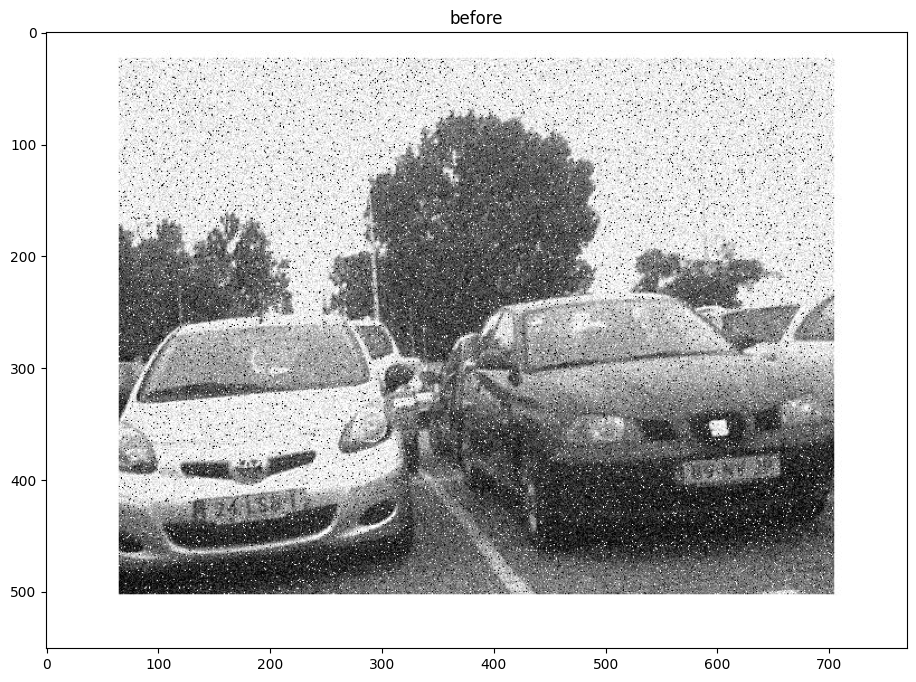

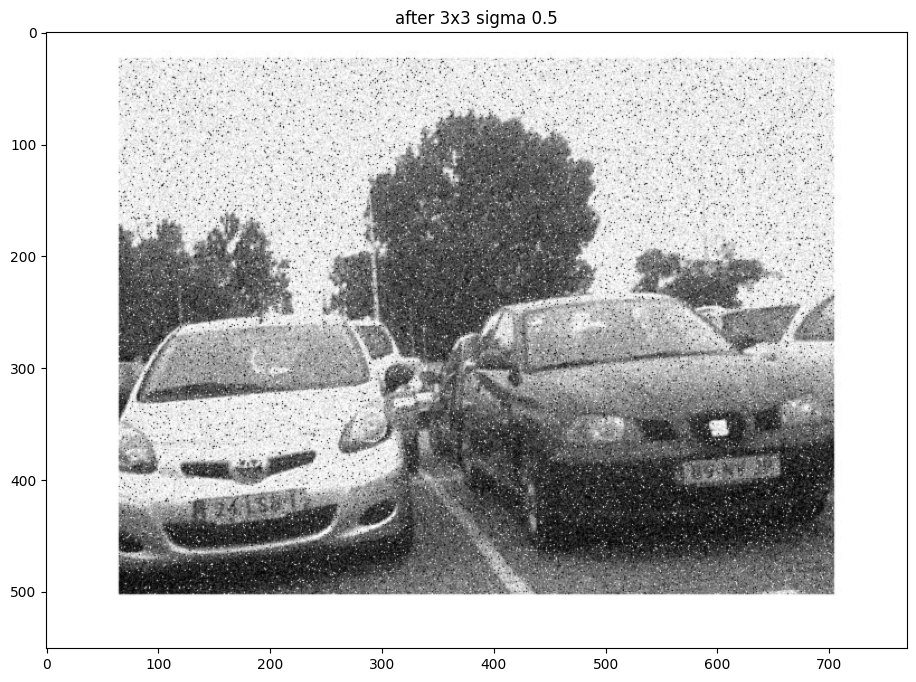

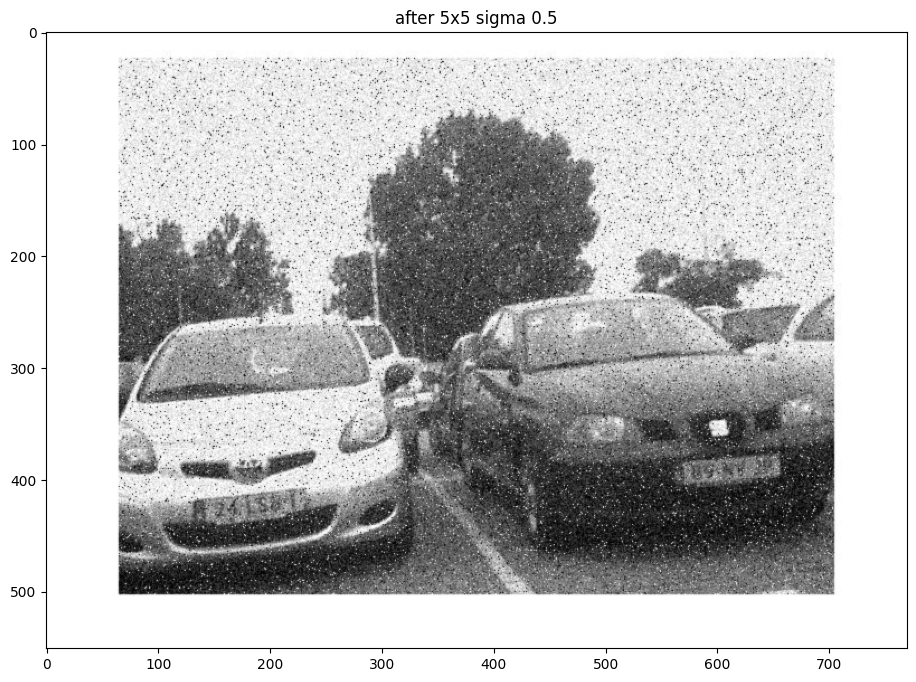

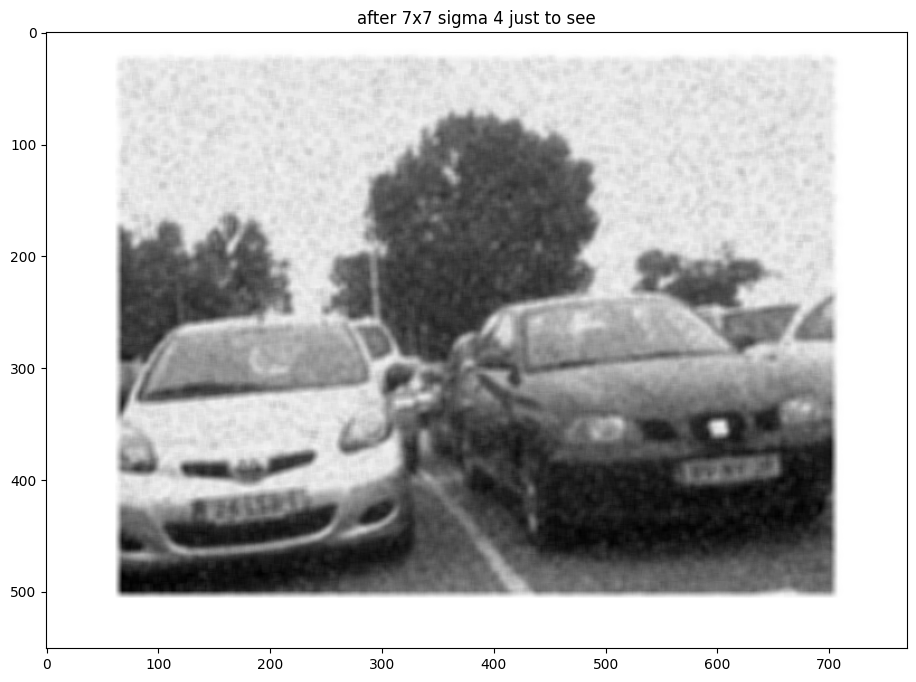

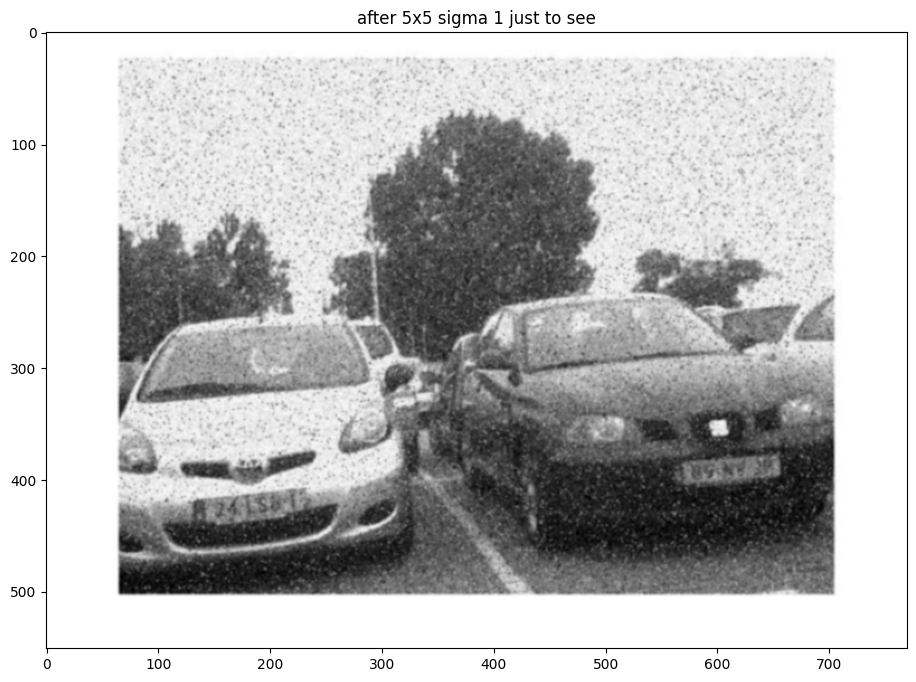

In [14]:
# Define a function to create a gaussian kernel
def gaussianKernel (kernelSize, sigma):
    if kernelSize % 2 == 0:
        raise ValueError("Kernel size must be an odd number.")

    kernel = np.fromfunction(
        lambda x, y: (1/ (2 * np.pi * sigma**2)) * 
                     np.exp(-((x - (kernelSize-1)//2)**2 + (y - (kernelSize-1)//2)**2) / (2 * sigma**2)),
        (kernelSize, kernelSize)
    )

    return kernel / np.sum(kernel)
    
# Define a function to do the filtering with a gaussian kernel
def gaussianFilter(img, gaussianKernel, padding):  
    assert np.isclose(np.sum(gaussianKernel), 1, rtol=0.01), 'Seems like you Gaussian Kernel does not sum up to 1. Check for correctness and if kernelSize is large enough.'
    
    return cv2.filter2D(img, -1, gaussianKernel)

# Load image           
path = "resources/lab_03/exercise_01/"

# Plot original image
image = loadImage(path, "car_noisy_gray.jpg")
plotImage(image, "before", plt.cm.gray)
# Create different kernels
k3 = gaussianKernel(3, 0.5)
k5 = gaussianKernel(5, 0.5)
k7 = gaussianKernel(7, 4)
kb = gaussianKernel(5, 1)
# Reduce noise using the defined filter function with different kernel sizes as parameters
i3 = gaussianFilter(image, k3, 0)
i5 = gaussianFilter(image, k5, 0)
i7 = gaussianFilter(image, k7, 0)
ib = gaussianFilter(image, kb, 0)
# Plot the images

plotImage(i3, "after 3x3 sigma 0.5", plt.cm.gray)
plotImage(i5, "after 5x5 sigma 0.5", plt.cm.gray)
plotImage(i7, "after 7x7 sigma 4 just to see", plt.cm.gray)
plotImage(ib, "after 5x5 sigma 1 just to see", plt.cm.gray)

<div style="background-color:#c2eafa">

### III.1.4 Median filter - non-linear filtering

Another method to remove noise is using a median filter. Apply the median filter to the input image. 

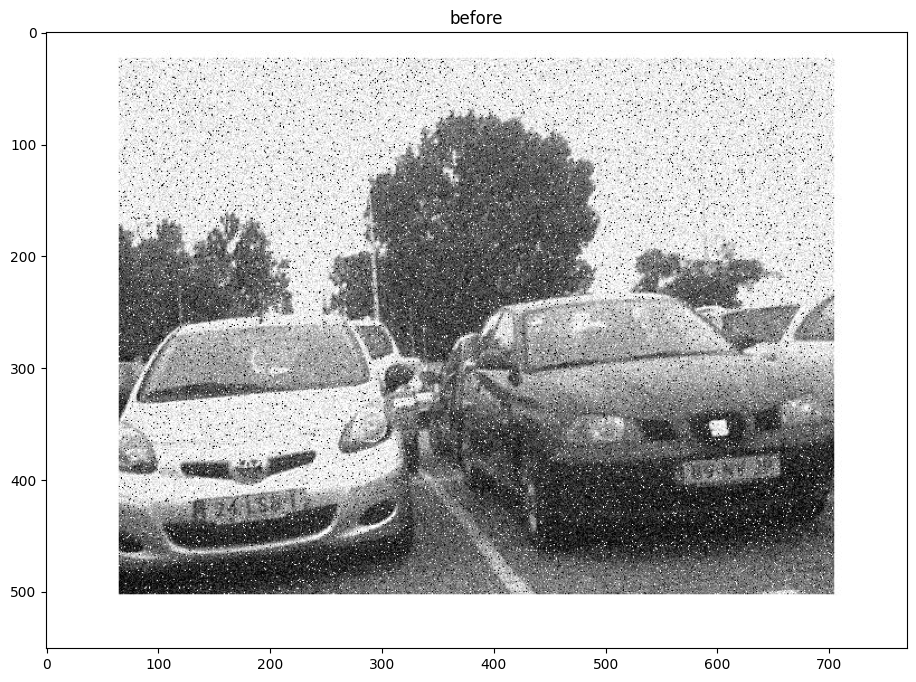

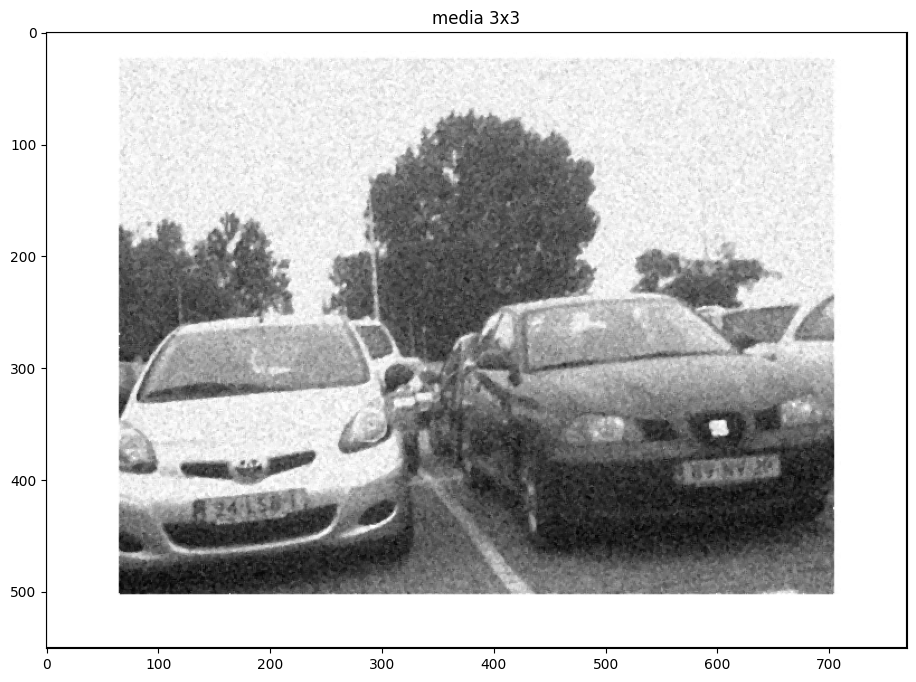

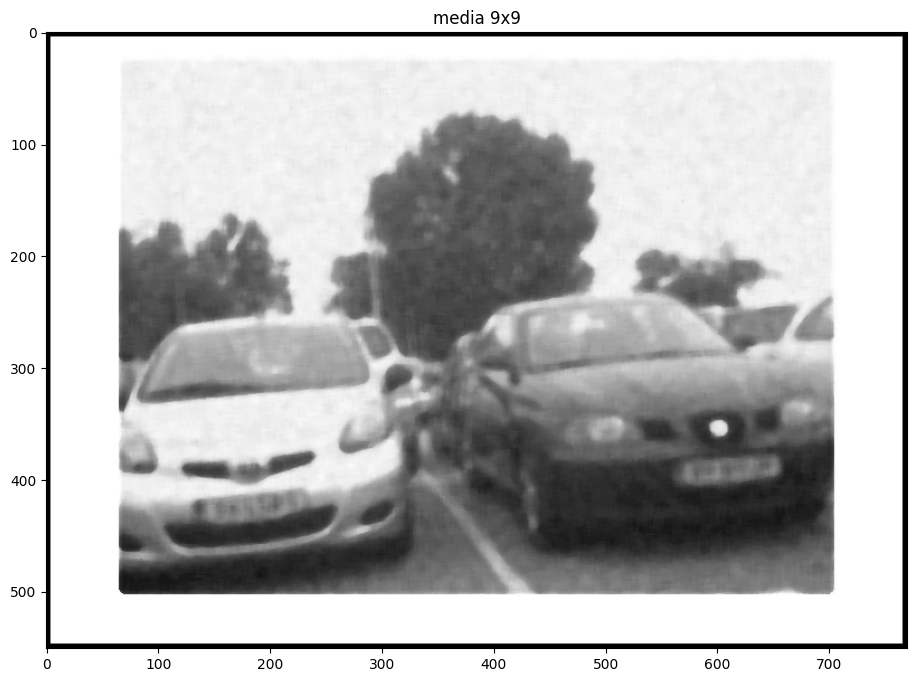

In [63]:
# Define a function to do the filtering based on the median value
def medianFilter(image, kernelSize, padding=0):
    
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Get image and kernel dimensions
    img_height, img_width = image.shape
    kernelSize =  kernelSize // 2
    # Initialize the filtered image
    filtered_image = np.zeros_like(image, dtype = np.float64)

    # Apply filter using convolution or cross-correlation
    for i in range(kernelSize, img_height - kernelSize):
        for j in range(kernelSize, img_width - kernelSize):
            img_subset = image[i-kernelSize:i+kernelSize+1, j-kernelSize:j+kernelSize+1]
            filtered_image[i, j] = np.median(np.ndarray.flatten(img_subset))
    return filtered_image
    
# Load image
path = "resources/lab_03/exercise_01/"

# Plot the original image
image = loadImage(path, "car_noisy_gray.jpg")
plotImage(image, "before", plt.cm.gray)
# Create different kernels
k1 = 3
k2 = 9
# Reduce noise using the defined filter function with different kernel sizes as parameters
image_median_3 = medianFilter(image, k1)
image_median_9 = medianFilter(image, k2)
# Plot the images
plotImage(image_median_3, "media 3x3", plt.cm.gray)
plotImage(image_median_9, "media 9x9", plt.cm.gray)


<div style="background-color:#c2eafa">

### (OPTIONAL) III.1.5 Noise reduction combined
Given the input image: reduce the noise using any of the previously implemented noise reduction methods. You can also use a combination of methods if you think that works better.


In [ ]:
# Load image
path = "lab_03/exercise_01/"

# Reduce noise using the defined filter function/s with different kernel sizes as parameters

# Plot the images

### Questions section

<div style="background-color:#c2eafa">
<i>
<b>
Analyze the responses you got
</b>
</i>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span>  <i>
    Which filter size worked best for each image?
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

7x7 seems to work the best, 5x5 is also good. 3x3 seems to be a bit small to notice a differnce at times

</div>

<div style="background-color:#c2eafa">

<hr><span style="font-size: 20px">❓</span> <i>
Why did that size work better than the rest for that image?
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

**Type your answer here.**
</div>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
    What are the factors that you need to take into consideration when choosing a box filter?
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

We need to take into account the size of the image, the size of the effect we are looking for. For example if we want a subtle blurr then a smaller filter is better. If we have a big box filter then the avg will be taken from a larger window and thus smoothen it much more.
</div>

<div style="background-color:#c2eafa">
<hr>
<i>
<b>

Box filter or a gaussian filter  elements always sum up to a value of 1, research for the reason behind such a design choice.
</b>
</i>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
Why is that?
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

This is done to make sure we dont often get values above 1 (or 255) because if we dont normalize then it is very easy to get pixel value overflows.
</div>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
What are the effects on the output image when the sum of the LTI smoothing filter (box or gaussian) is less than 1?
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

Less than one darkenss the picture
</div>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
What are the effects on the output image when the sum of the LTI smoothing filter (box or gaussian) is greater than 1?
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

Greater than one makes the pciture brighter
</div>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
How does choosing a sigma value affect the final result? 
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

**Type your answer here.**
the larger the sigma value the more similar to a box filter it is, so the more smooth and lossy it is. 
</div>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
For what purposes would you use different sigma values (e.g. 1, 2 or 3)?
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

**Type your answer here.**
if i wanted to keep more of the orginal center. Lower sigma values give more importance to the center pixel in the kernel, and larger are closer to a box filter.
</div>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
What happens to the size of the images after applying the filters? (hint: think about the parameters that you were using)
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

**Type your answer here.**
It depends on how we handle overflow. If you add padding then th eimage grows by the amount of (padding * width + padding * height) * 2 - 4 pixels
If you dont add padding and just ignore the kernel width // 2 and kernel height // 2 and so u leave those pizels be and u dont change the size of the image
</div>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
Does the median filter reduce the noise in an effective way on the input image compared to the gaussian filter? Compare based on different parameters and image sources.
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

The median removes the noise in a better way, this is because wehave salt and pepper noise, which the media is good at removing. It is good at removing becuase its small specs out of place, bit flips etc. So the median vote alows us to get a pretty good noise removal
</div>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
(OPTIONAL) If we apply multiple filters, does the order of applying the filters matter? If yes explain why and if not explain why not.
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

**Type your answer here.**
</div>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
(OPTIONAL) Did you manage to produce a better filter by combining the previous ones?
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

**Type your answer here.**
</div>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
(OPTIONAL) Which combination of filters worked best for the images provided?
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

**Type your answer here.**
</div>

## PYTHON HANDS-ON Assignment III.2: High-pass filter - Sharpening images using filtering



<div style="background-color:#00A6D6; padding:10px; color: white; border-radius: 10px" >
<p style="font-size:25px">💬</p>
Once you're finished with the first set of images provided by Jeeves you move on to the second batch. Going through the images you see that the storm has caused them to become blurry. Now you know that you have to enhance the quality of the edges using the familiar to you high pass filter. Or in other words you'll need to sharpen the image.

</div>

<b>Completion requirements for this assignment:</b>
    
- Implement image sharpening 
- Use different sharpening filters and analyze which one gives the best result
- Answer all the questions regarding the process and images

<div style="background-color:#c2eafa">

### III.2.1 Sharpening filter
Another type of filter that is used very often is the sharpening one. Its main purpose is to bring out more detail in the image that is being filtered. Implement the image sharpening filter given in the lecture slides.

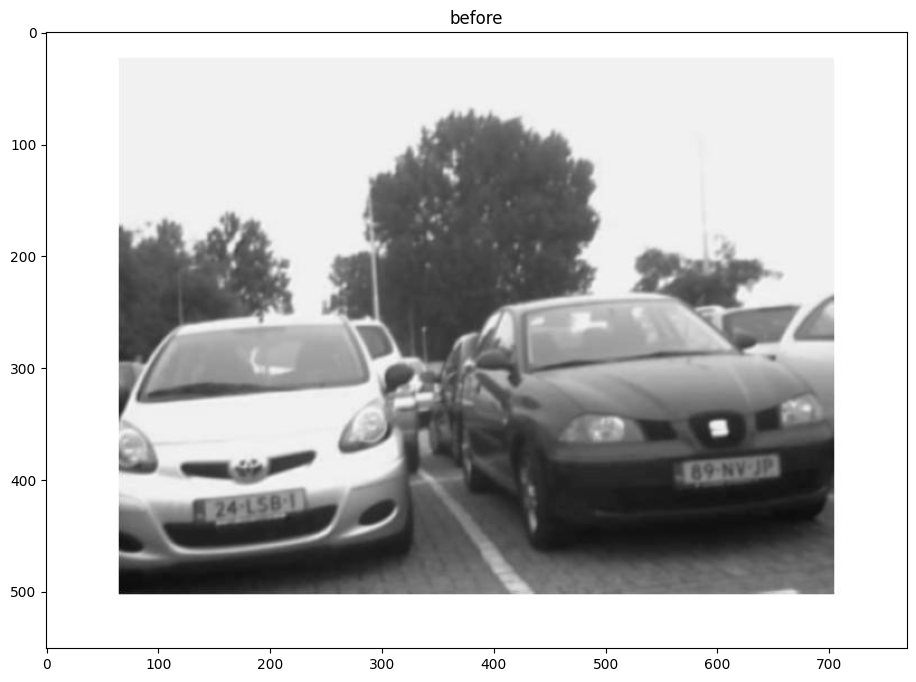

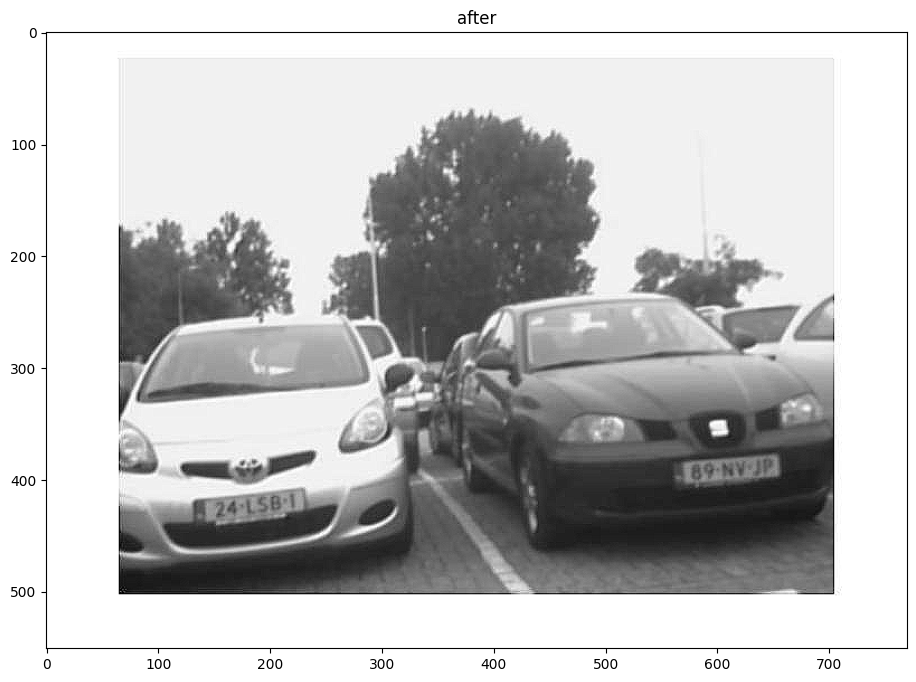

In [18]:
# Define a function to do the filtering
def sharpeningFilter(img, kernel):  

    return cv2.filter2D(img, -1, kernel)


# Load image
path = "resources/lab_03/exercise_02/"

# Plot the original image
image = loadImage(path, "car_blury_gray.jpg")
plotImage(image, "before", plt.cm.gray)
# Plot the original image

# Create the sharpening kernel from the slides
kernelSharp = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]]) #using the laplacian

# Sharpen the image using the defined filter function

sharpened = sharpeningFilter(image, kernelSharp)
# Plot the images
plotImage(sharpened, "after", plt.cm.gray)

<div style="background-color:#c2eafa">

### III.2.2 Sharpening filter wih different parameters
Sharpen the image using the defined filter function using different filter configurations (kernel size & values). Implement at least 3 different filter configurations. 


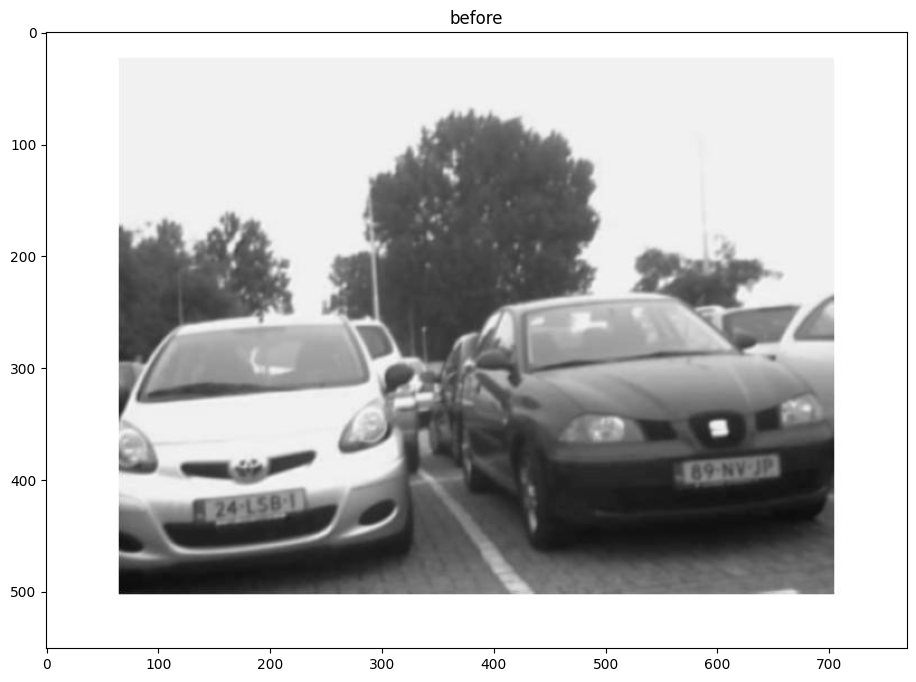

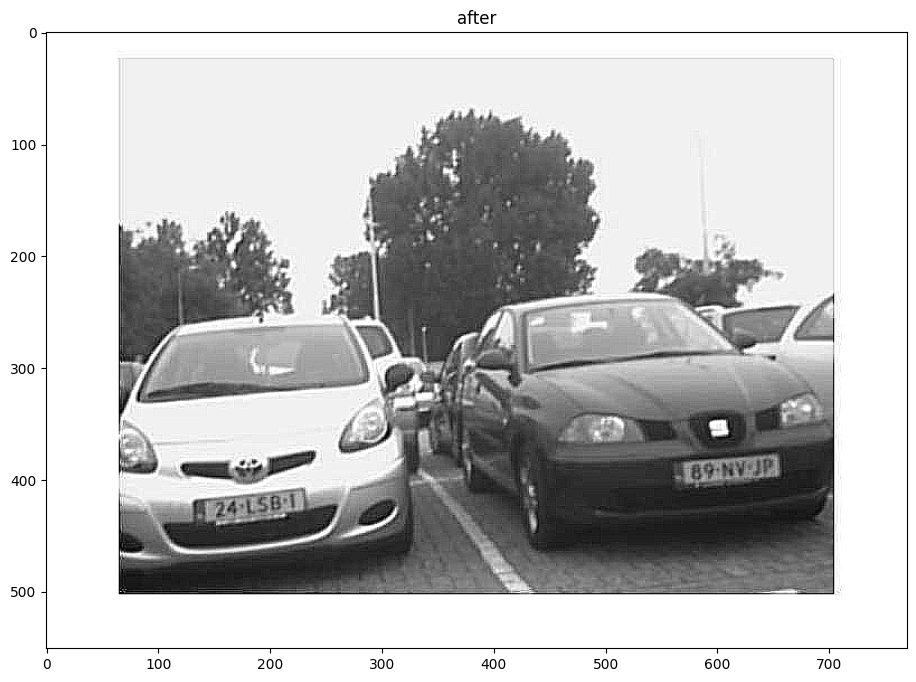

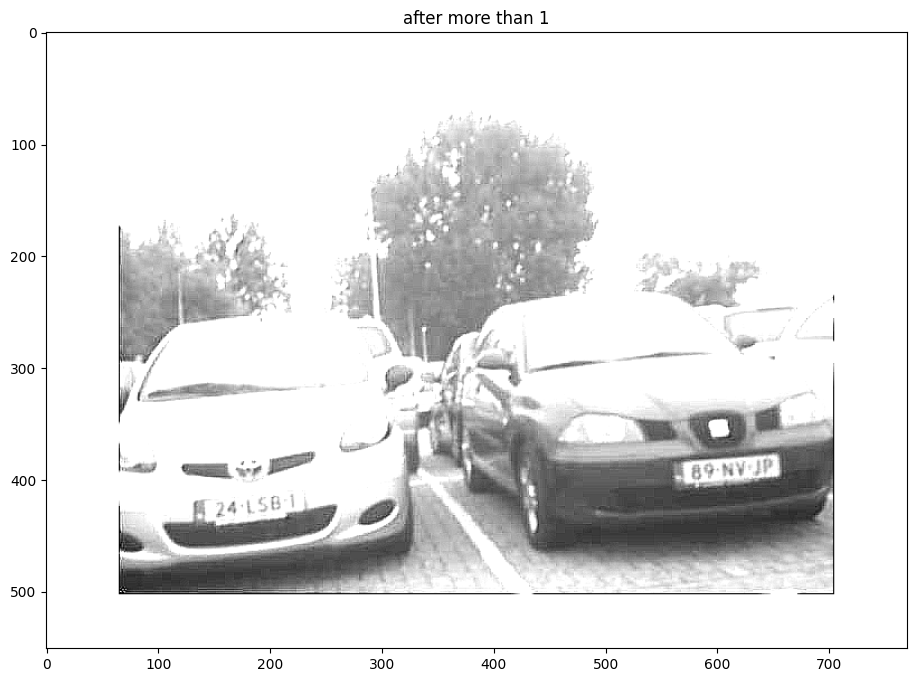

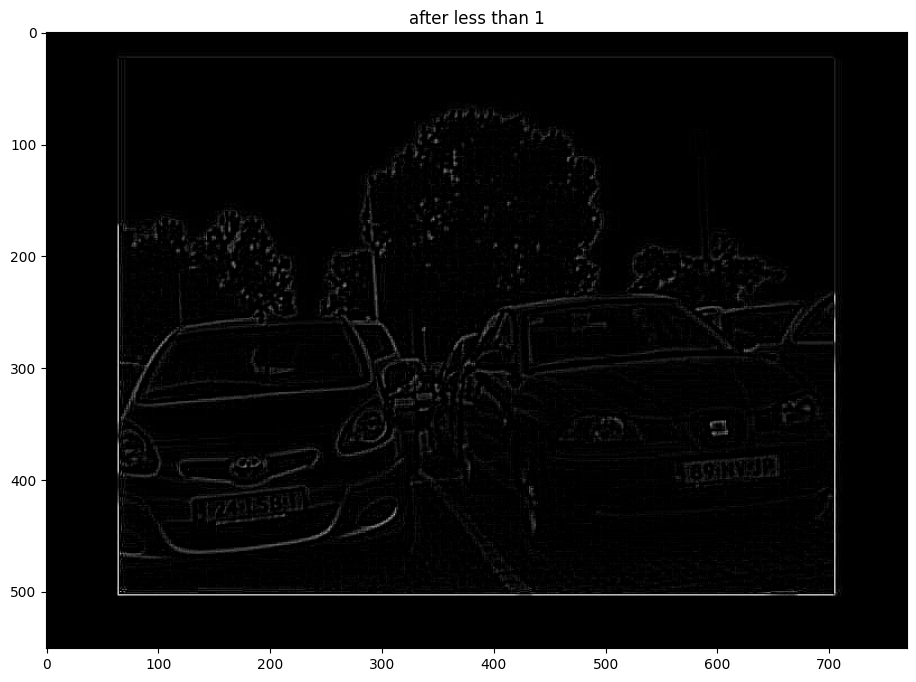

In [23]:
# Create different kernels

# Sharpen the image using the defined filter function using different kernel sizes and filter configurations
kernel_wrong_more = np.array([[-1,-1,-1],[-1, 10, -1],[-1,-1,-1]])
kernel_bigger = np.array([[-1,-1,-1],[-1, 9, -1],[-1,-1,-1]])
kernel_wrong_less = np.array([[-1,-1,-1],[-1, 8, -1],[-1,-1,-1]])

sharpened_bigger = sharpeningFilter(image, kernel_bigger)
sharpened_more = sharpeningFilter(image, kernel_wrong_more)
sharpened_less = sharpeningFilter(image, kernel_wrong_less)
# Plot the images
plotImage(image, "before", plt.cm.gray)
plotImage(sharpened_bigger, "after", plt.cm.gray)
plotImage(sharpened_more, "after more than 1", plt.cm.gray)
plotImage(sharpened_less, "after less than 1", plt.cm.gray)
# Plot the images


### Questions section

<div style="background-color:#c2eafa">
<i>
    <b>
Sharpening filter elements always sum up to a value of 1, research the reason behind such a design choice. (type your answer in the yellow fields below)
    </b>
</i>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
Why is that?
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

**Type your answer here.**
The perserve the image color median
</div>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
What are the effects on the output image when the sum is less than 1?
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

**Type your answer here.**
Image gets darker but the edges stay 
</div>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
What are the effects on the output image when the sum is greater than 1? 
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

**Type your answer here.**
Gets too bright, makes sense because the median color gets bigger
</div>

## PYTHON HANDS-ON Assignment III.3: Experimenting with filters by your own design

<div style="background-color:#00A6D6; padding:10px; color: white; border-radius: 10px" >
<span style="font-size:25px">💬</span>
After going through the stacks of images served by Jeeves in rapid succession fueled by the coffee machine downstairs you have some time left in your day. With the caffeine rushing in your system you decide to experiment seeing if different approaches might give you more "enhanced" results for the images. 

</div>


<b> Completion requirements for this assignment: </b>
- Design a symmetrical filter to test out on the images
- Design an asymmetrical filter to test out on the images
- Design your own filter to test out in the images
- Filters must improve the quality of the images
- Answer all the questions regarding the process and images

<div style="background-color:#c2eafa">

### III.3.1 Symmetrical filtering
In this part you are creating a <b>symmetrical filter</b>. You have the freedom to choose your own filter size and exact values. Feel free to experiment until you reach a result that you deem satisfactory.

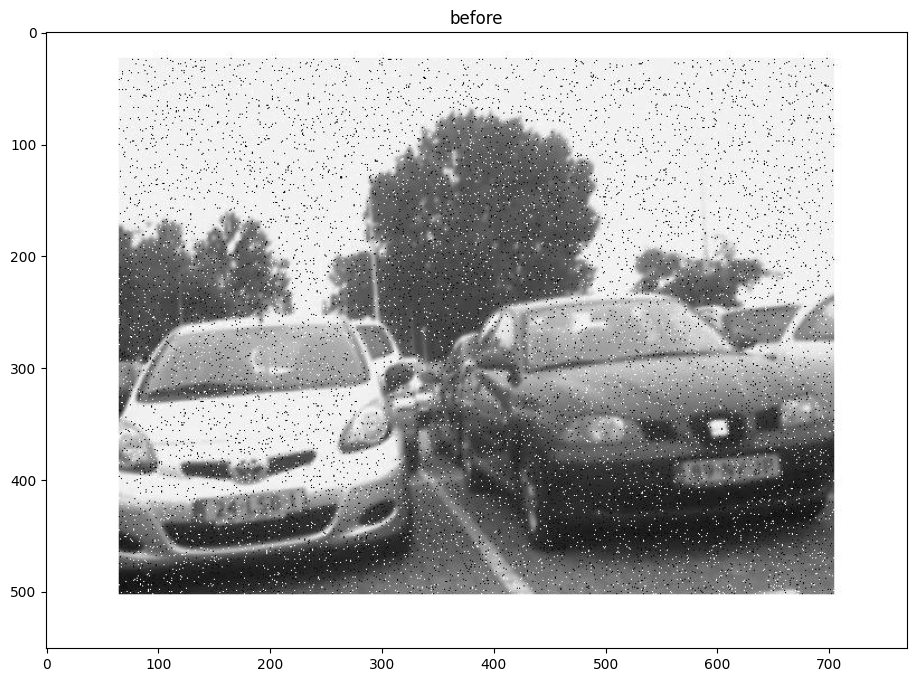

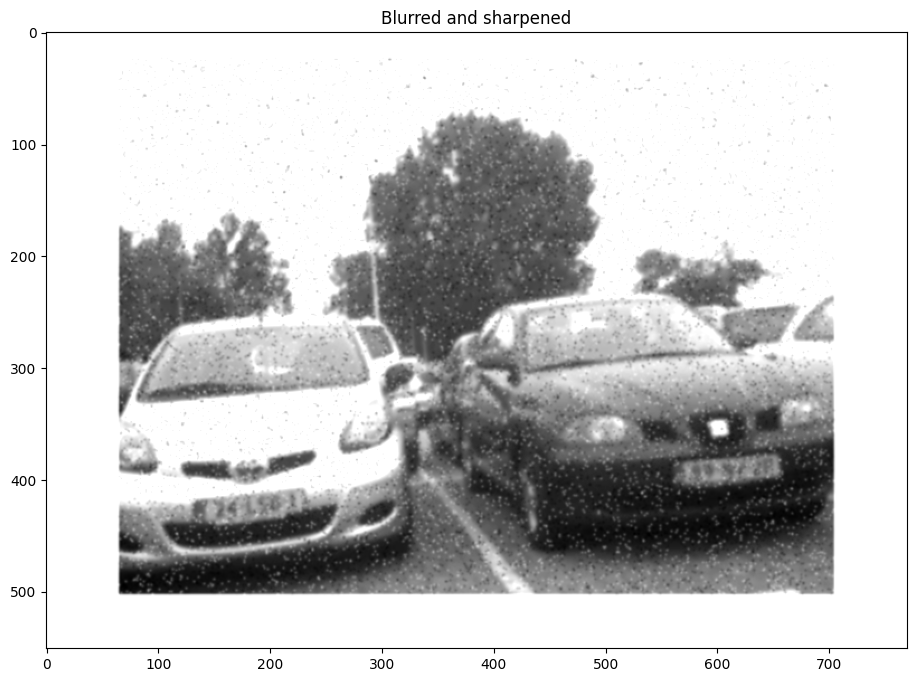

In [37]:
# Define a function to do the filtering
def symmetricalFilter(img, kernel):  

    return img

# Load image
path = "resources/lab_03/exercise_03/"

# Plot the original image
image = loadImage(path, "car_all_gray.jpg")
plotImage(image, "before", plt.cm.gray)
# Plot the original image

# Create kernel/s

gaussian_kernel = gaussianKernel(5, 1) * 1.2
# Filter the image/s using the created kernel/s
image_blured = cv2.filter2D(image, -1, gaussian_kernel)
# Plot the images

plotImage(image_blured, "Blurred and sharpened", plt.cm.gray)

<div style="background-color:#c2eafa">

### III.3.2 Asymmetrical filtering
In this part you are creating an <b>asymmetrical filter</b>. You have the freedom to choose your own filter size and exact values. Feel free to experiment until you reach a result that you deem satisfactory.

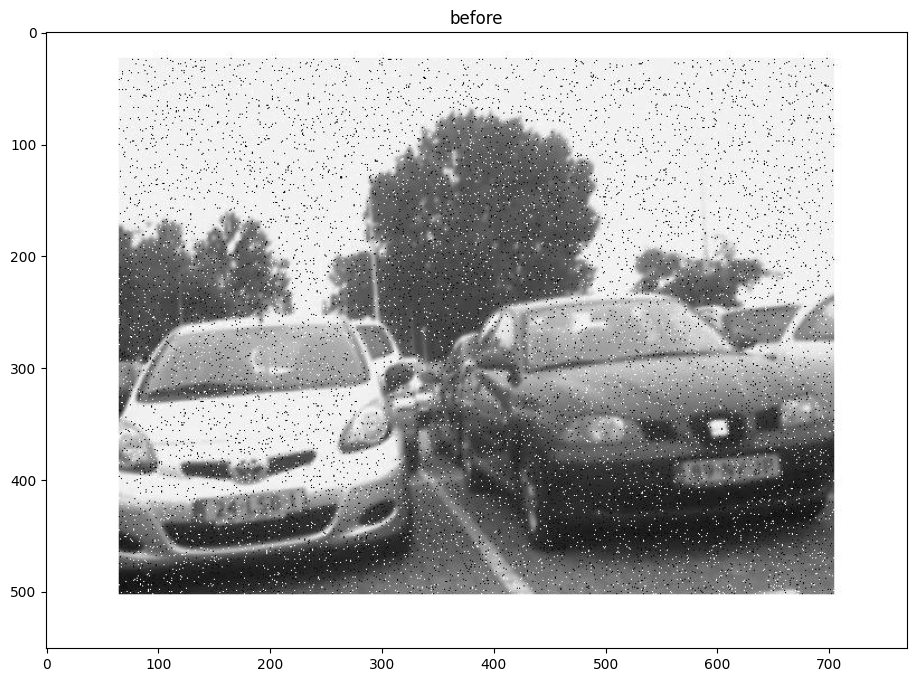

C:\Users\ahell\AppData\Local\Temp\ipykernel_10020\1879708606.py:13: DeprecationWarning: This function is deprecated. Please call randint(0, 10 + 1) instead
  kern = np.array([[np.random.random_integers(0,10) for i in range(5)] for i in range(5)])


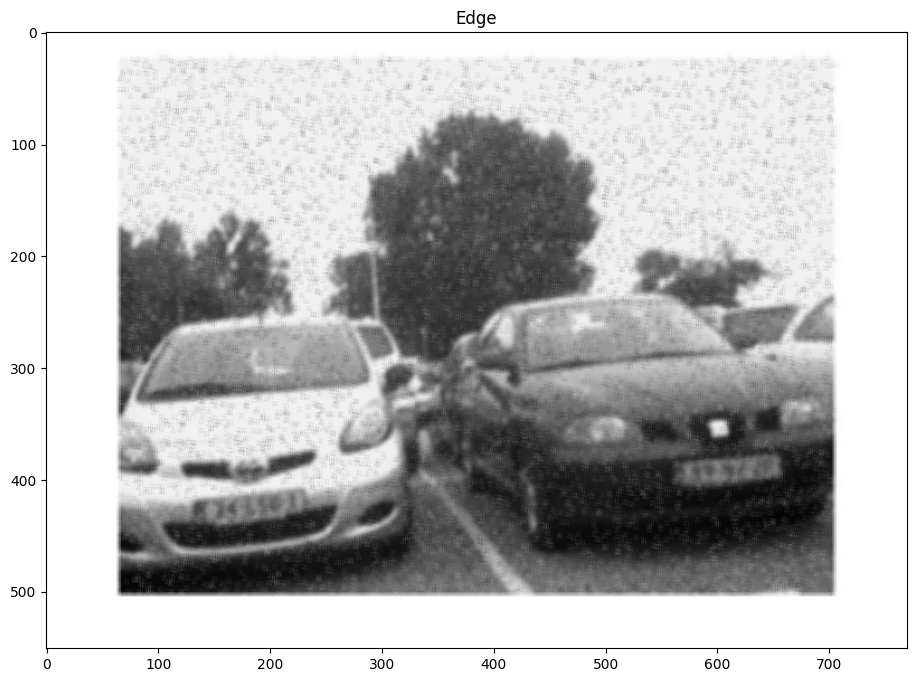

In [54]:
# Define a function to do the filtering
def asymmetricalFilter(img, kernel):  

    return img

# Load image
path = "resources/lab_03/exercise_03/"

# Plot the original image
image = loadImage(path, "car_all_gray.jpg")
plotImage(image, "before", plt.cm.gray)
# Create kernel/s
kern = np.array([[np.random.random_integers(0,10) for i in range(5)] for i in range(5)])
kern[0,0] = 11
kern = kern * (1 / np.sum(kern))
# Filter the image/s using the created kernel/s
edge = cv2.filter2D(image, -1, kern)

# Plot the images
plotImage(edge, "Edge", plt.cm.gray)

<div style="background-color:#c2eafa">

### III.3.3 A filter by any other name
Now you decide to try out something completely different from what you've been working with so far. You'll be creating <b>your own filter</b>. You have the freedom to choose your own filter size and exact values. Feel free to experiment until you reach a result that you deem satisfactory.

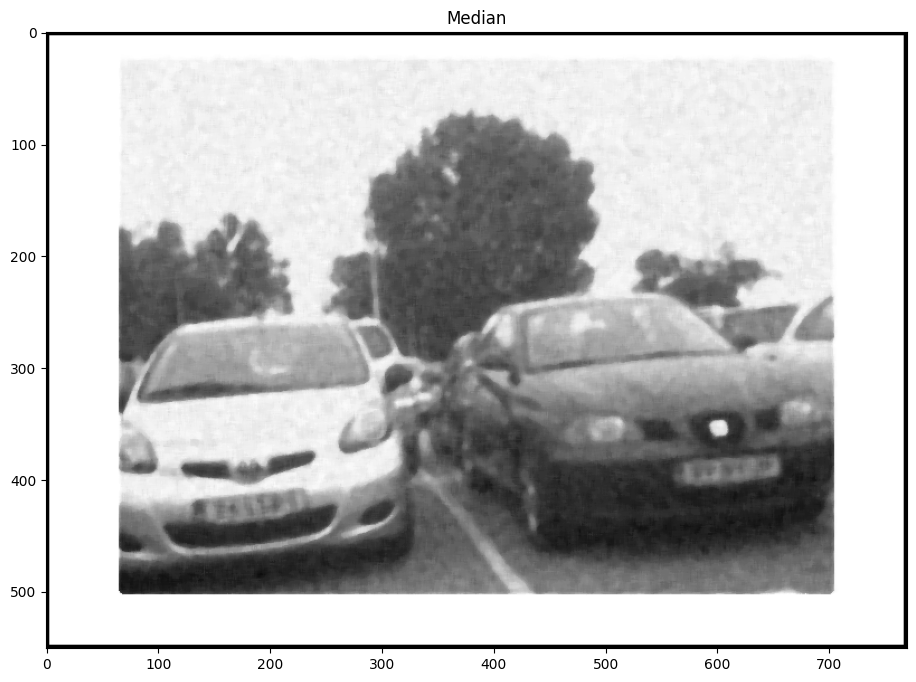

In [61]:
# Define a function to do the filtering
def customFilter(img, kernel):  

    return img

# Load image
path = "lab_03/exercise_03/"


# Plot the original image

# Create kernel/s
median = medianFilter(image, 7)
plotImage(median, "Median", plt.cm.gray)

# Filter the image/s using the created kernel/s

# Plot the images



### Questions section

<div style="background-color:#c2eafa">
<i>
    <b>
Compare the three final filters you've created. (type your answer in the yellow fields below)
    </b>
</i>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
What are their similarities and differences?
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

**Type your answer here.**
The salt and pepper artificatcs are always kinda there
All three are somewhat blury and hard to make them sharper or not. If you try sharpening with the artifacts then it creates more artifacts.
</div>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
Which one performed best and for what conditions?
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

**Type your answer here.**
The median filter is the best, its rlly good at removing the salt and pepper and not distorting the rest of the image too much

</div>

<div style="background-color:#c2eafa">
<hr><span style="font-size: 20px">❓</span> <i>
Do you think the filters you've created have a practical application? Explain your answer for each filter individually
</i>

<div style="background-color:#f1be3e; padding:10px; color: white; border-radius: 10px" >

**Type your answer here.**
Yes they can help removing noise
</div>

⚠️__**Checklist before submitting**__

(try to fix anything that you can't tick from the checkboxes below)

In [64]:
# !pip install ipywidgets

import ipywidgets as widgets

check1 = widgets.Checkbox(              
    value=False,
    description='Filled in all of the yellow fields with answers to the questions marked with ❓',
    indent=False,
    layout={'width':'1000px'}
)
check2 = widgets.Checkbox(              
    value=False,
    description='Haven\'t used imports outside of those provided in the original notebook for this assignment',
    indent=False,
    layout={'width':'1000px'}
)
check3 = widgets.Checkbox(              
    value=False,
    description='All the code blocks can be run in sequence and execute successfully',
    indent=False,
    layout={'width':'1000px'}
)
check4 = widgets.Checkbox(              
    value=False,
    description='Haven\'t changed the layout or formatting in the notebook and have only written in the appropriate code cells or yellow areas',
    indent=False,
    layout={'width':'1000px'}
)
display(check1, check2, check3, check4)

Checkbox(value=False, description='Filled in all of the yellow fields with answers to the questions marked wit…

Checkbox(value=False, description="Haven't used imports outside of those provided in the original notebook for…

Checkbox(value=False, description='All the code blocks can be run in sequence and execute successfully', inden…

Checkbox(value=False, description="Haven't changed the layout or formatting in the notebook and have only writ…